# Shade my Run
## Data Exploration

- [LIDAR Data](https://daac.ornl.gov/cgi-bin/dsviewer.pl?ds_id=1537)


From [Summary](https://daac.ornl.gov/CMS/guides/CMS_LiDAR_AGB_California.html):

"This dataset provides estimates of aboveground biomass and spatially explicit uncertainty from 53 airborne LiDAR surveys of locations throughout California between 2005 and 2014. Aboveground biomass was estimated by performing individual tree crown detection and applying a customized "remote sensing aware" allometric equation to these individual trees. Aboveground biomass estimates and their uncertainties for each study area are provided in per-tree and gridded format. The canopy height models used for the tree detection and biomass estimation are also provided.
There are 9,504 files in compressed shapefile format (*.shp contained in *.zip) and 212 files in GeoTIFF format (*.tif) included in this dataset."


In [2]:
import pandas 
import numpy
import gdal
import shapefile as shp
import matplotlib.pyplot as plt
from glob import glob

### TIF files

First we will try try and see how to work with these files in python. First up is the *.tif files.  These are geotiffs that have location and value information for each pixel similar to standard n-channel image.  For these files we can use GDAL to read the images (inlcuding specific channels), convert them to arrays and disaply them with mpl. 

* note that GDAL can be sort of tricky to install.  the conda package is a good option on windows. 

['./data\\Taliaferro2013_agb.tif', './data\\Taliaferro2013_chm.tif']


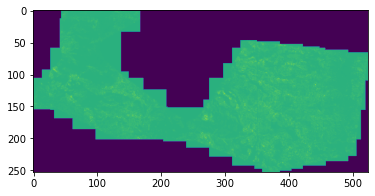

In [3]:
tiff_files = glob('./data/*.tif')
print(tiff_files)
agb = gdal.Open(tiff_files[0]).ReadAsArray()
img = plt.imshow(agb)
plt.show()

### Shape files

The shaped files are a little more challenging.  Each tree is represented by a polygon object which a set of coordinates.   One popular package for dealign with shapes is pyshp.  In addition the files are zipped so we used pyhton's ZipFile library to open the folder withour extracting all the files. 

Then we use mpl to plot the shapes by looping over all the polygon coordiantes. 

* Note that shapes files only cover a portion of each tif file

In [16]:
from zipfile import ZipFile

shape_name = 'Taliaferro2013_3992854N_12308761W'
shape_file = f'./data/{shape_name}.zip'
zipshape = ZipFile(shape_file)
shape = shp.Reader(shp=zipshape.open(shape_name+'.shp'),
                   shx=zipshape.open(shape_name+'.shx'),
                   dbf=zipshape.open(shape_name+'.dbf'))


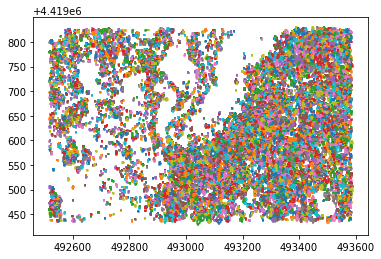

In [15]:
plt.figure()
for shape in shape.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    plt.plot(x,y)
plt.show()